In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt 
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression

from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense, Dropout, Reshape, Conv1D, MaxPooling1D, Flatten, concatenate, BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.layers import concatenate
from tensorflow.keras.models import Model

data=pd.read_csv('heart_attack_youngsters_india.csv')
data.shape

(10000, 26)

# Heart Attack Likelihood vs Features

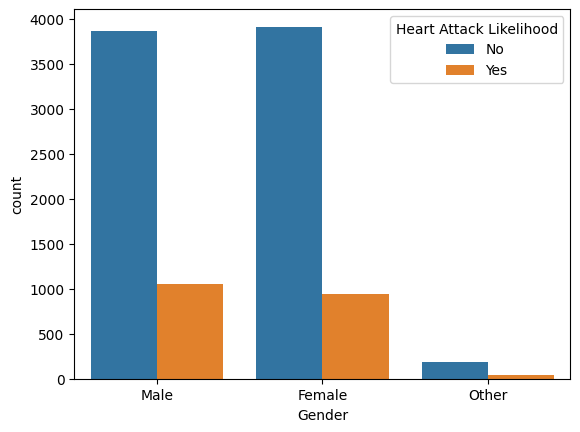

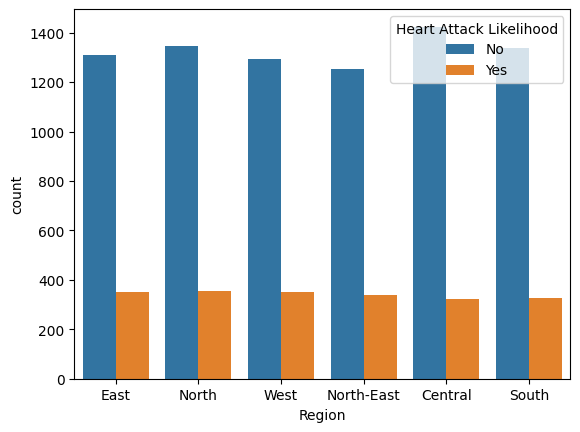

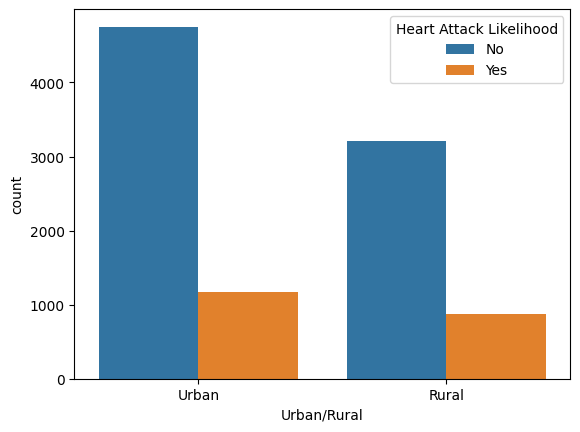

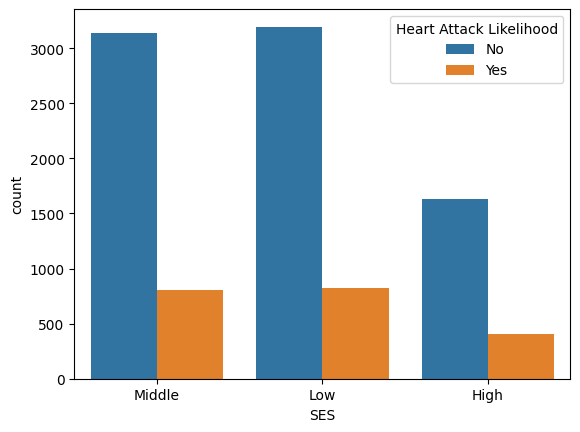

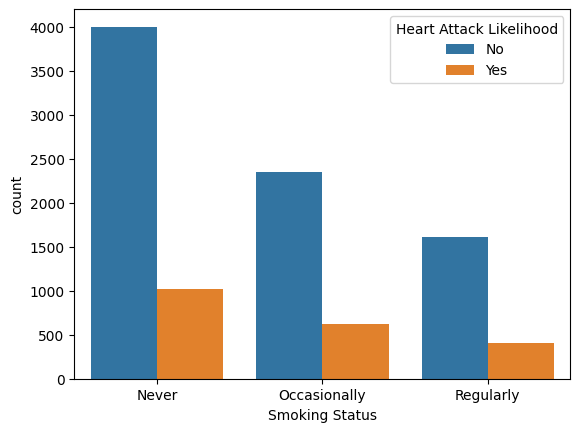

...

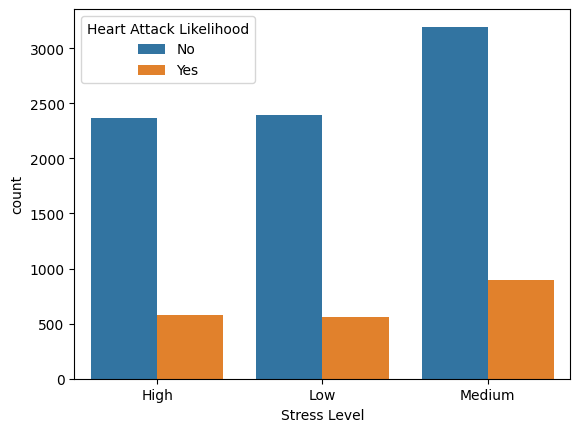

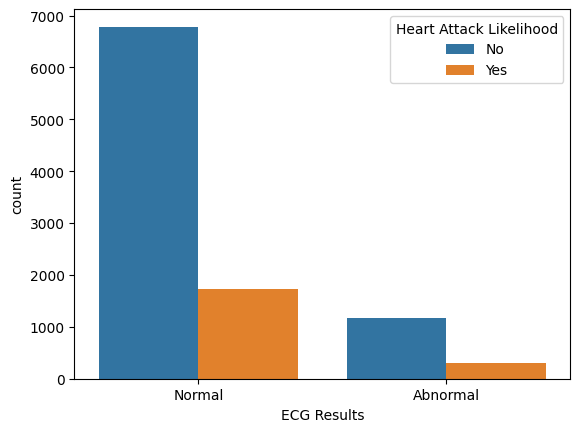

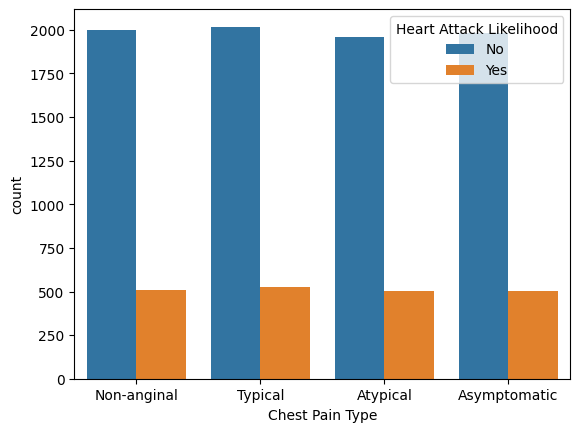

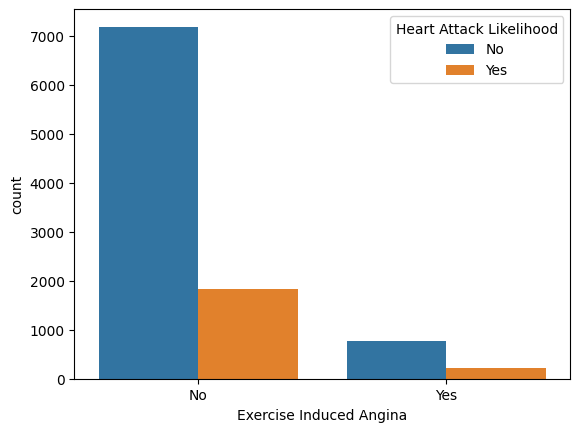

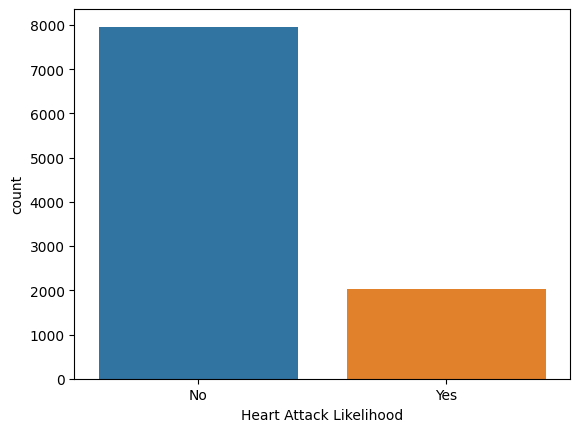

In [3]:
data.columns
data['systolic']=data['Blood Pressure (systolic/diastolic mmHg)'].apply(lambda x:float(x.split('/')[0]))
data['diastolic']=data['Blood Pressure (systolic/diastolic mmHg)'].apply(lambda x:float(x.split('/')[1]))
data.drop(['Blood Pressure (systolic/diastolic mmHg)'], axis=1, inplace=True)
cat_cols=data.select_dtypes(include='object').columns
for i in cat_cols:
  sns.countplot(data=data, x=i, hue = 'Heart Attack Likelihood')
  plt.show()

# Correlation Matrix

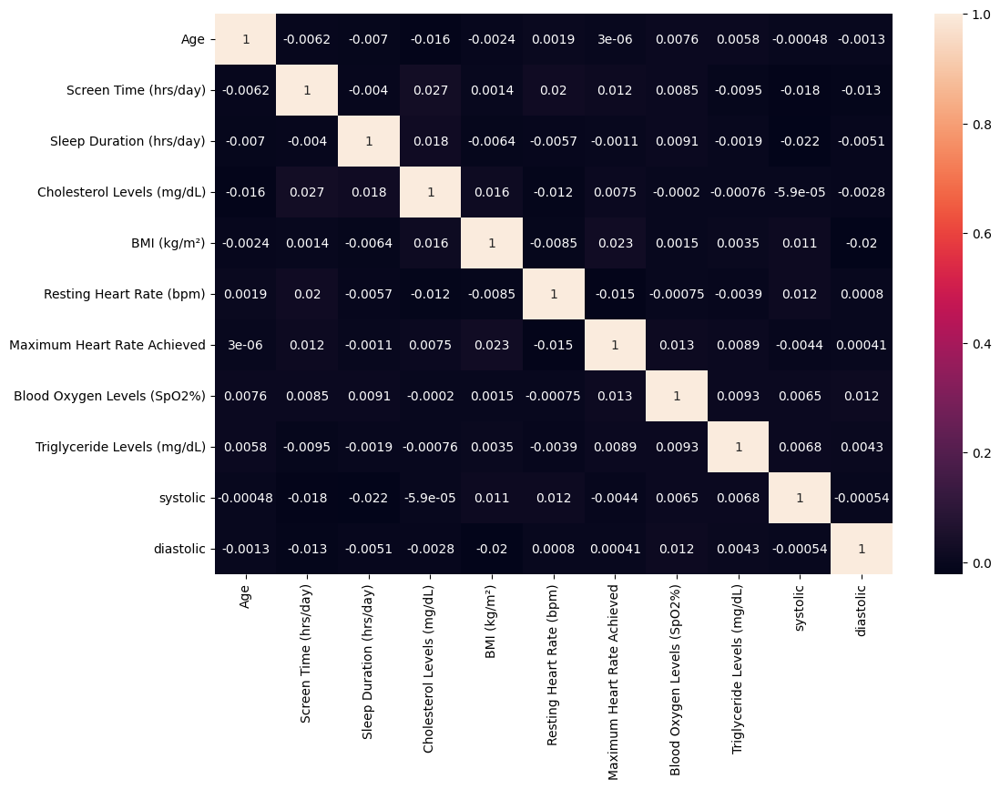

In [4]:
num_cols= data.select_dtypes(include=['int64', 'float64'])
cm=num_cols.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True)
plt.show()

### In above correlation matrix we can't see much correlation between among the columns, if you observe the annotations all values are near zero which indicates bad correlation between the features.

# Histogram

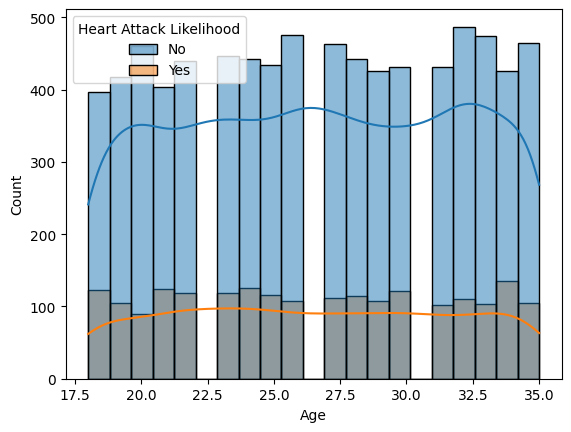

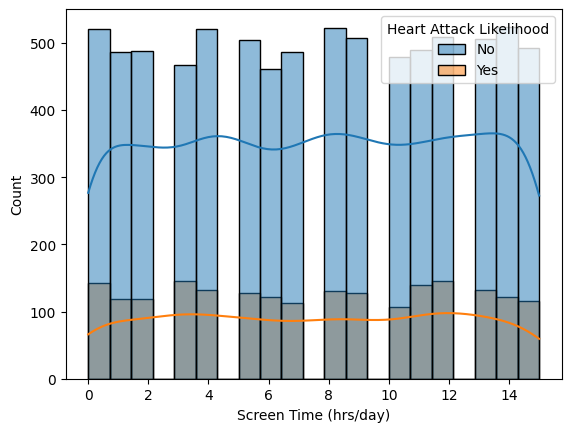

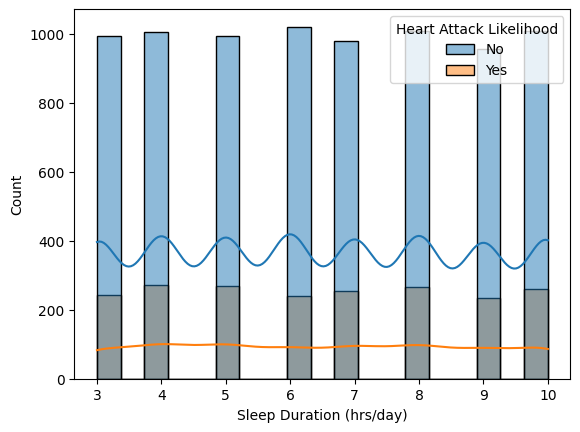

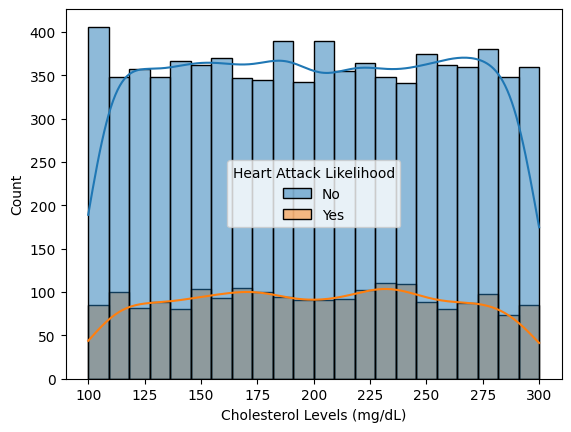

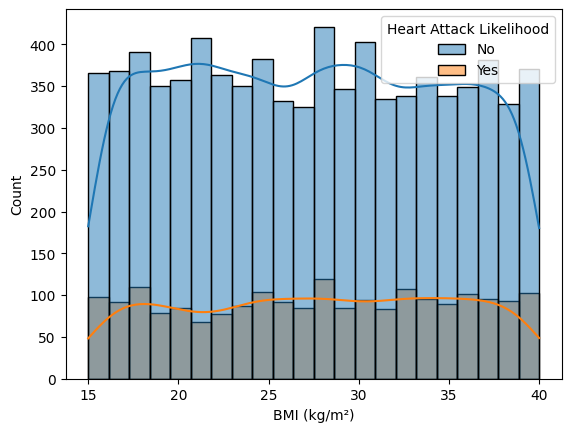

...

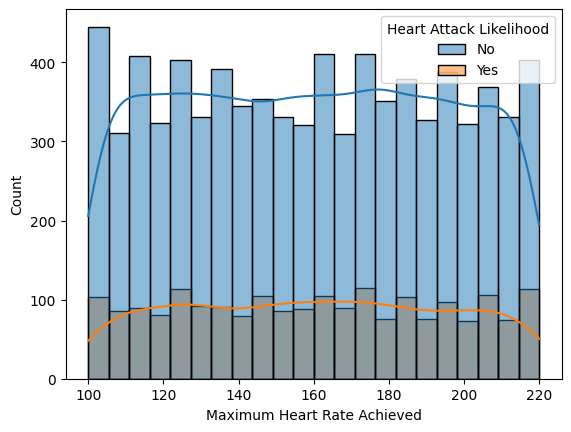

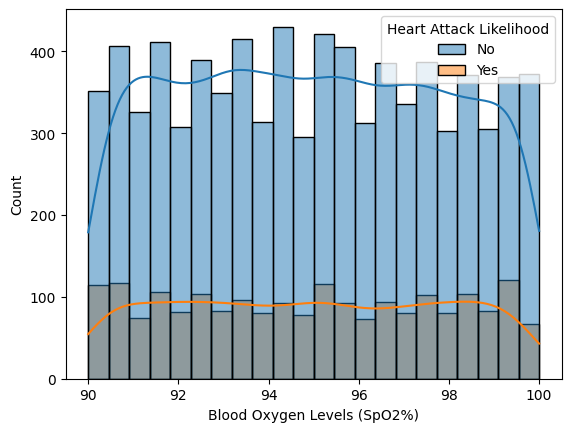

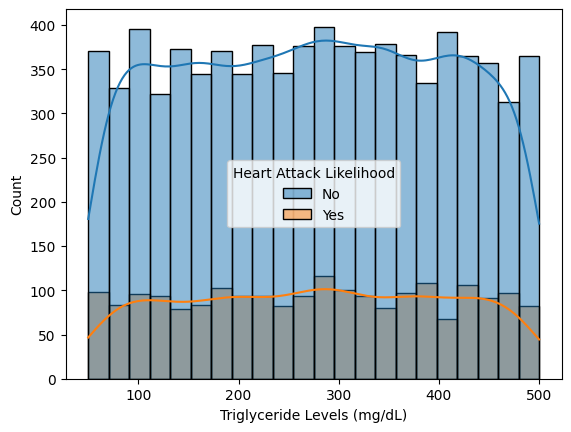

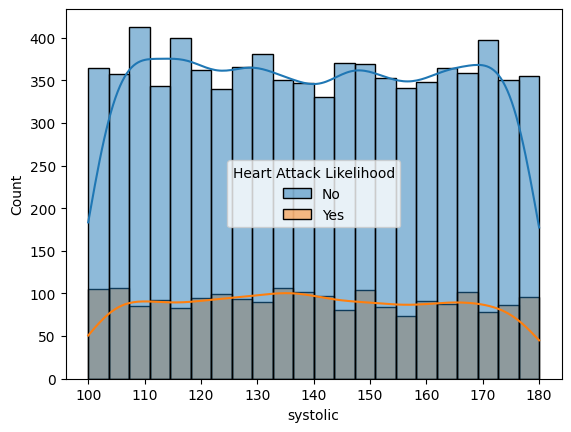

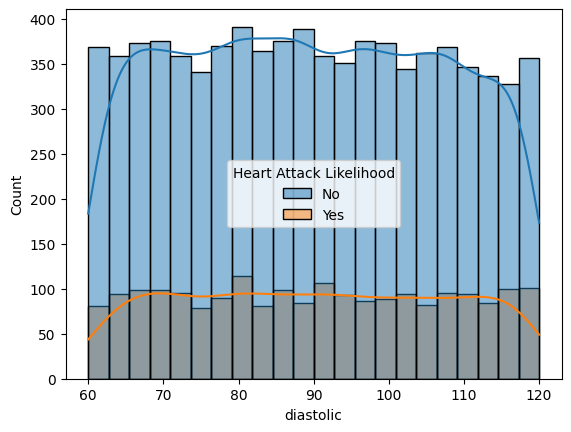

In [5]:
cols= num_cols.columns
for i in cols:
  sns.histplot(data=data, x=i, hue='Heart Attack Likelihood', kde=True)
  plt.show()

# Density

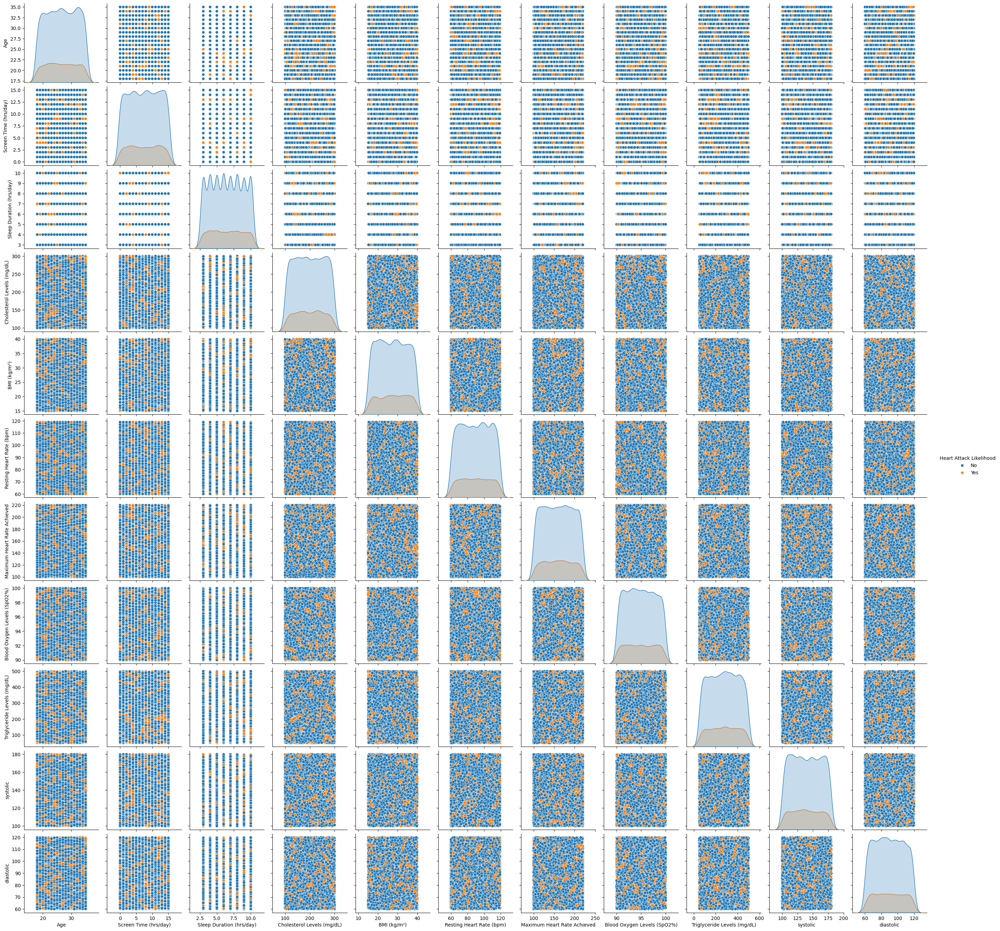

In [6]:
sns.pairplot(data=data, hue='Heart Attack Likelihood')
plt.show()

### After observing above densely populated scatterplots, there is no cluster difference between Heart attack likely hood (Yes/ No).

In [ ]:
le=LabelEncoder()
labels={'Male':1, 'Female':0, 'Other':2}
data['Gender']=data['Gender'].map(labels)
data['Heart Attack Likelihood']=data['Heart Attack Likelihood'].map({'Yes':1, 'No':0})  
data['Urban/Rural']=data['Urban/Rural'].map({'Urban':1, 'Rural':0}) 
region =pd.get_dummies(data['Region']).astype(int)
ses=pd.get_dummies(data['SES']).astype(int)
smoking_status = pd.get_dummies(data['Smoking Status']).astype(int)
alcohol_cons=pd.get_dummies(data['Alcohol Consumption']).astype(int)  
phisical_activity=pd.get_dummies(data['Physical Activity Level']).astype(int)
stress = pd.get_dummies(data['Stress Level']).astype(int)
chest_pain=pd.get_dummies(data['Chest Pain Type']).astype(int)
data=pd.concat([data, region, ses, smoking_status, alcohol_cons, phisical_activity, stress, chest_pain], axis=1)
data.drop(['Region', 'SES', 'Smoking Status', 'Alcohol Consumption', 'Physical Activity Level', 'Stress Level', 'Chest Pain Type'], axis=1, inplace=True)
data['Diet Type']= le.fit_transform(data['Diet Type'])
data['Family History of Heart Disease'] = le.fit_transform(data['Family History of Heart Disease'])
data['Diabetes']= le.fit_transform(data['Diabetes'])
data['Hypertension']=le.fit_transform(data['Hypertension'])
data['ECG Results']= le.fit_transform(data['ECG Results'])
data['Exercise Induced Angina']=le.fit_transform(data['Exercise Induced Angina'])

# Standard Scalar before Train-Test Split

In [8]:
# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import RobustScaler
# ss=StandardScaler()
# co=['Age', 'Screen Time (hrs/day)', 'Sleep Duration (hrs/day)', 'Cholesterol Levels (mg/dL)', 'BMI (kg/m²)', 'Resting Heart Rate (bpm)', 'Maximum Heart Rate Achieved', 'Blood Oxygen Levels (SpO2%)', 'Triglyceride Levels (mg/dL)', 'systolic', 'diastolic']
# data[co]= ss.fit_transform(data[co])
# # data[co]= ss.fit(data[co])

# Robust Scalar before Train-Test Split

In [9]:
# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import RobustScaler
# rob = RobustScaler()
# co=['Age', 'Screen Time (hrs/day)', 'Sleep Duration (hrs/day)', 'Cholesterol Levels (mg/dL)', 'BMI (kg/m²)', 'Resting Heart Rate (bpm)', 'Maximum Heart Rate Achieved', 'Blood Oxygen Levels (SpO2%)', 'Triglyceride Levels (mg/dL)', 'systolic', 'diastolic']
# data[co]= rob.fit_transform(data[co])
# # data[co]= rb.fit(data[co])

In [10]:
# from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE
# X=data.drop(['Heart Attack Likelihood'], axis=1)
# y=data['Heart Attack Likelihood'] 
# x_resampled, y_resampled = SMOTE().fit_resample(X, y) 
# print(x_resampled.shape, y_resampled.shape)
# x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, random_state=42)

# After Train-Test Split

In [ ]:
# Define features and target
X = data.drop(['Heart Attack Likelihood'], axis=1)
y = data['Heart Attack Likelihood']

# Apply SMOTE to balance the dataset
X_resampled, y_resampled = SMOTE().fit_resample(X, y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Scale only after splitting using training set statistics
scaler = RobustScaler()
# scaler = StandardScaler()
x_train = scaler.fit_transform(X_train)  
x_test = scaler.transform(X_test) 


# Logistic Regression and SMOTE

0.8737833594976452


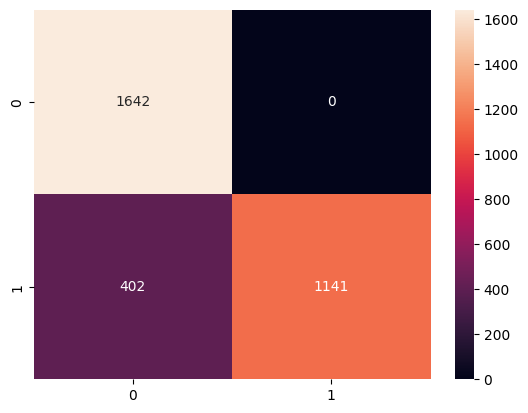

              precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [ ]:
lr=LogisticRegression()
lr.fit(x_train, y_train)
y_pred=lr.predict(x_test)
score = lr.score(x_test, y_test)
print(score)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.show()
print(classification_report(y_test, y_pred))

# Deep Neural Network (batch_size = 16)

In [ ]:
nn_model = Sequential([
    Dense(512, activation='relu', kernel_initializer='he_normal', input_shape=(x_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),

    Dense(256, activation='relu', kernel_initializer='he_normal'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='relu'),
    Dropout(0.2),

    Dense(1, activation='sigmoid')  
])

# Use a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

nn_model.compile(optimizer=Adam(learning_rate=0.0001),
                 loss='binary_crossentropy',
                 metrics=['accuracy'])


# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
history = nn_model.fit(x_train, y_train, 
                       validation_data=(x_test, y_test),
                       epochs=200, batch_size=16, verbose=1, 
                       callbacks=[lr_scheduler, early_stopping])

# Predictions
y_pred_nn = (nn_model.predict(x_test) > 0.5).astype("int32")

# Model Evaluation
accuracy_nn = accuracy_score(y_test, y_pred_nn)
precision_nn = precision_score(y_test, y_pred_nn)
recall_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)
roc_auc_nn = roc_auc_score(y_test, y_pred_nn)

Epoch 1/200


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


797/797 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6131 - loss: 0.7063 - val_accuracy: 0.8179 - val_loss: 0.4064 - learning_rate: 1.0000e-04
Epoch 2/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.7671 - loss: 0.5041 - val_accuracy: 0.8587 - val_loss: 0.3593 - learning_rate: 1.0000e-04
Epoch 3/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.7868 - loss: 0.4652 - val_accuracy: 0.8644 - val_loss: 0.3436 - learning_rate: 1.0000e-04
Epoch 4/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.8190 - loss: 0.4068 - val_accuracy: 0.8703 - val_loss: 0.3366 - learning_rate: 1.0000e-04
Epoch 5/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.8319 - loss: 0.3878 - val_accuracy: 0.8710 - val_loss: 0.3312 - learning_rate: 1.0000e-04
Epoch 6/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8330 - loss: 0.3900 - val_accuracy: 0.8716 - val_loss: 0.3323 - learning_rate: 1.0000e-04
Epoch 7/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 

Neural Network Accuracy: 0.8725
Precision: 1.0000
Recall: 0.7369
F1-Score: 0.8485
AUC-ROC: 0.8684


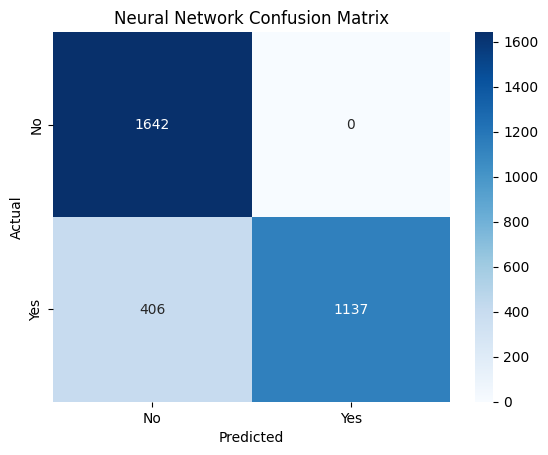

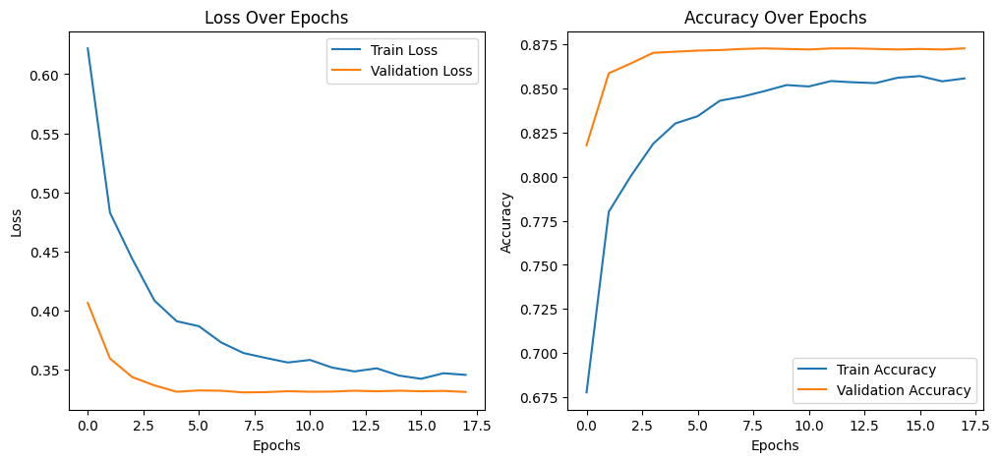


Neural Network Classification Report:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [14]:
# Print evaluation metrics
print(f"Neural Network Accuracy: {accuracy_nn:.4f}")
print(f"Precision: {precision_nn:.4f}")
print(f"Recall: {recall_nn:.4f}")
print(f"F1-Score: {f1_nn:.4f}")
print(f"AUC-ROC: {roc_auc_nn:.4f}")

# Confusion Matrix
conf_matrix_nn = confusion_matrix(y_test, y_pred_nn)
sns.heatmap(conf_matrix_nn, annot=True, fmt="d", cmap="Blues", xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Neural Network Confusion Matrix")
plt.show()

# Plot Training Progress (Loss and Accuracy)
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Classification Report
print("\nNeural Network Classification Report:\n", classification_report(y_test, y_pred_nn))

# DNN (kernel_initializer=glorot_uniform(), batch_size = 8)

In [ ]:
nn_model = Sequential([
    Dense(512, activation='relu', kernel_initializer=glorot_uniform(), input_shape=(x_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),

    Dense(256, activation='relu', kernel_initializer=glorot_uniform()),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='relu'),
    Dropout(0.2),

    Dense(1, activation='sigmoid')  
])

# Use a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

nn_model.compile(optimizer=Adam(learning_rate=0.0001),
                 loss='binary_crossentropy',
                 metrics=['accuracy'])


# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
history = nn_model.fit(x_train, y_train, 
                       validation_data=(x_test, y_test),
                       epochs=200, batch_size=8, verbose=1, 
                       callbacks=[lr_scheduler, early_stopping])

# Predictions
y_pred_nn = (nn_model.predict(x_test) > 0.5).astype("int32")

# Model Evaluation
accuracy_nn = accuracy_score(y_test, y_pred_nn)
precision_nn = precision_score(y_test, y_pred_nn)
recall_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)
roc_auc_nn = roc_auc_score(y_test, y_pred_nn)

Epoch 1/200


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1593/1593 ━━━━━━━━━━━━━━━━━━━━ 15s 7ms/step - accuracy: 0.6239 - loss: 0.7035 - val_accuracy: 0.8546 - val_loss: 0.3726 - learning_rate: 1.0000e-04
Epoch 2/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.7712 - loss: 0.4924 - val_accuracy: 0.8697 - val_loss: 0.3419 - learning_rate: 1.0000e-04
Epoch 3/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.7969 - loss: 0.4551 - val_accuracy: 0.8713 - val_loss: 0.3333 - learning_rate: 1.0000e-04
Epoch 4/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.8134 - loss: 0.4183 - val_accuracy: 0.8722 - val_loss: 0.3287 - learning_rate: 1.0000e-04
Epoch 5/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.8201 - loss: 0.4082 - val_accuracy: 0.8732 - val_loss: 0.3279 - learning_rate: 1.0000e-04
Epoch 6/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.8250 - loss: 0.3983 - val_accuracy: 0.8732 - val_loss: 0.3301 - learning_rate: 1.0000e-04
Epoch 7/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step 

Neural Network Accuracy: 0.8735
Precision: 1.0000
Recall: 0.7388
F1-Score: 0.8498
AUC-ROC: 0.8694


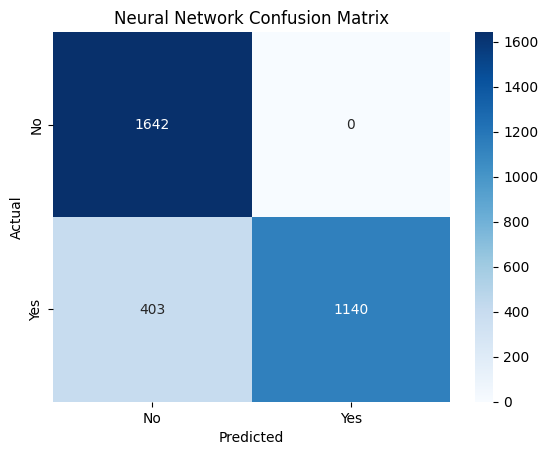

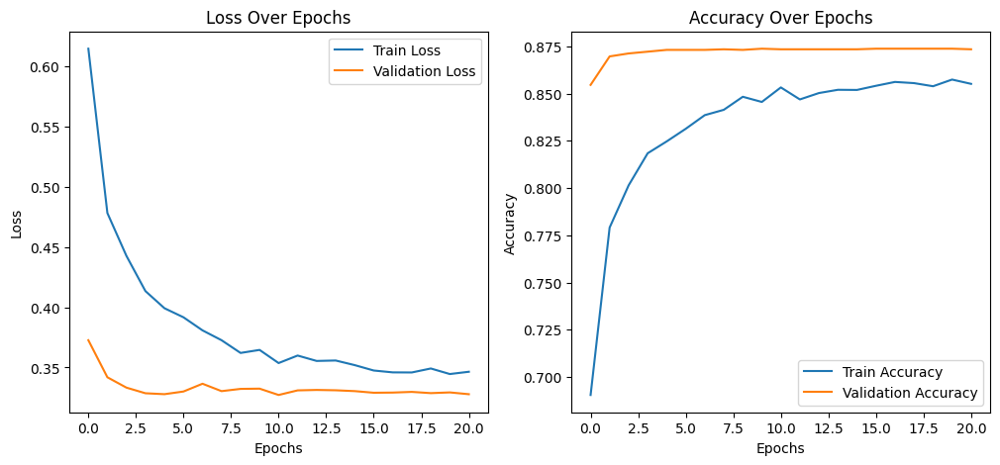


Neural Network Classification Report:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [16]:
# Print evaluation metrics
print(f"Neural Network Accuracy: {accuracy_nn:.4f}")
print(f"Precision: {precision_nn:.4f}")
print(f"Recall: {recall_nn:.4f}")
print(f"F1-Score: {f1_nn:.4f}")
print(f"AUC-ROC: {roc_auc_nn:.4f}")

# Confusion Matrix
conf_matrix_nn = confusion_matrix(y_test, y_pred_nn)
sns.heatmap(conf_matrix_nn, annot=True, fmt="d", cmap="Blues", xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Neural Network Confusion Matrix")
plt.show()

# Plot Training Progress (Loss and Accuracy)
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Classification Report
print("\nNeural Network Classification Report:\n", classification_report(y_test, y_pred_nn))

# DNN (kernel_initializer = 'he_normal', batch_size = 8)

In [ ]:
nn_model = Sequential([
    Dense(512, activation='relu', kernel_initializer='he_normal', input_shape=(x_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),

    Dense(256, activation='relu', kernel_initializer='he_normal'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='relu'),
    Dropout(0.2),

    Dense(1, activation='sigmoid')  
])

# Use a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

nn_model.compile(optimizer=Adam(learning_rate=0.0001),
                 loss='binary_crossentropy',
                 metrics=['accuracy'])


# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
history = nn_model.fit(x_train, y_train, 
                       validation_data=(x_test, y_test),
                       epochs=200, batch_size=8, verbose=1, 
                       callbacks=[lr_scheduler, early_stopping])

# Predictions
y_pred_nn = (nn_model.predict(x_test) > 0.5).astype("int32")

# Model Evaluation
accuracy_nn = accuracy_score(y_test, y_pred_nn)
precision_nn = precision_score(y_test, y_pred_nn)
recall_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)
roc_auc_nn = roc_auc_score(y_test, y_pred_nn)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6020 - loss: 0.7211 - val_accuracy: 0.8443 - val_loss: 0.3832 - learning_rate: 1.0000e-04
Epoch 2/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7617 - loss: 0.5016 - val_accuracy: 0.8691 - val_loss: 0.3482 - learning_rate: 1.0000e-04
Epoch 3/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7887 - loss: 0.4623 - val_accuracy: 0.8703 - val_loss: 0.3398 - learning_rate: 1.0000e-04
Epoch 4/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8061 - loss: 0.4312 - val_accuracy: 0.8706 - val_loss: 0.3343 - learning_rate: 1.0000e-04
Epoch 5/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8150 - loss: 0.4117 - val_accuracy: 0.8710 - val_loss: 0.3364 - learning_rate: 1.0000e-04
Epoch 6/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8245 - loss: 0.4029 - val_accuracy: 0.8719 - val_loss: 0.3370 - learning_rate: 1.0000e-04
Epoch 7/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 6s 

Neural Network Accuracy: 0.8738
Precision: 1.0000
Recall: 0.7395
F1-Score: 0.8502
AUC-ROC: 0.8697


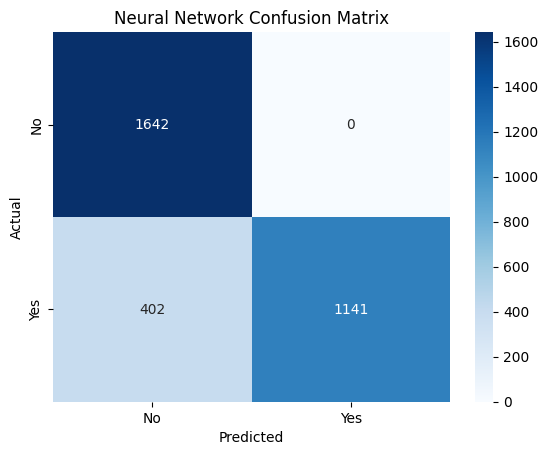

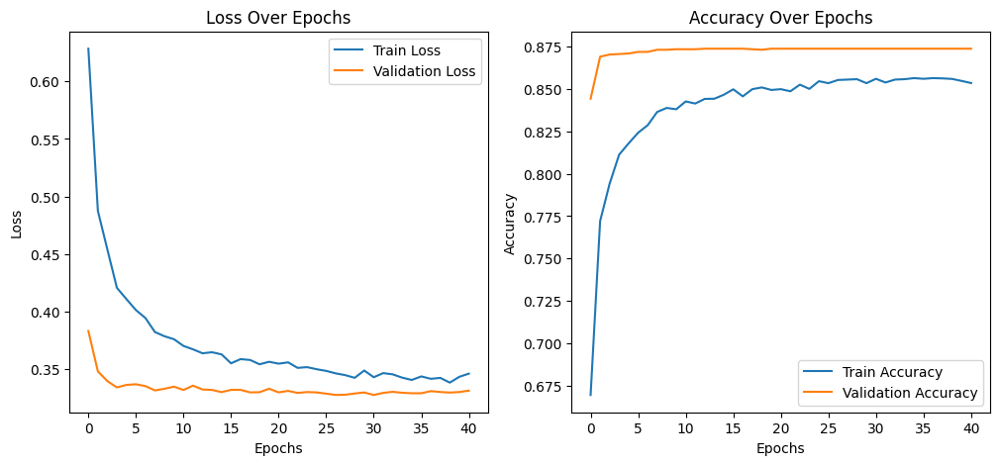


Neural Network Classification Report:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [27]:
# Print evaluation metrics
print(f"Neural Network Accuracy: {accuracy_nn:.4f}")
print(f"Precision: {precision_nn:.4f}")
print(f"Recall: {recall_nn:.4f}")
print(f"F1-Score: {f1_nn:.4f}")
print(f"AUC-ROC: {roc_auc_nn:.4f}")

# Confusion Matrix
conf_matrix_nn = confusion_matrix(y_test, y_pred_nn)
sns.heatmap(conf_matrix_nn, annot=True, fmt="d", cmap="Blues", xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Neural Network Confusion Matrix")
plt.show()

# Plot Training Progress (Loss and Accuracy)
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Classification Report
print("\nNeural Network Classification Report:\n", classification_report(y_test, y_pred_nn))

# Ensemble of FF and CNN (batch_size = 8)

In [ ]:
# Define multiple models
input_layer = Input(shape=(x_train.shape[1],))

# Feedforward branch
ff_branch = Dense(128, activation='relu')(input_layer)
ff_branch = Dropout(0.3)(ff_branch)

# CNN branch
cnn_branch = Reshape((x_train.shape[1], 1))(input_layer)
cnn_branch = Conv1D(64, kernel_size=3, activation='relu')(cnn_branch)
cnn_branch = MaxPooling1D(pool_size=2)(cnn_branch)
cnn_branch = Flatten()(cnn_branch)

# Concatenate branches
merged = concatenate([ff_branch, cnn_branch])
merged = Dense(64, activation='relu')(merged)
outputs = Dense(1, activation='sigmoid')(merged)

# Combined model
nn_model = keras.Model(inputs=input_layer, outputs=outputs)

# Use a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

nn_model.compile(optimizer=Adam(learning_rate=0.0001),
                 loss='binary_crossentropy',
                 metrics=['accuracy'])


# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping
history = nn_model.fit(x_train, y_train, 
                       validation_data=(x_test, y_test),
                       epochs=200, batch_size=8, verbose=1, 
                       callbacks=[lr_scheduler, early_stopping])

# Predictions
y_pred_nn = (nn_model.predict(x_test) > 0.5).astype("int32")

# Model Evaluation
accuracy_nn = accuracy_score(y_test, y_pred_nn)
precision_nn = precision_score(y_test, y_pred_nn)
recall_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)
roc_auc_nn = roc_auc_score(y_test, y_pred_nn)

Epoch 1/200


/var/folders/hr/gqdzl6r55w1309hz1qjzf1lh0000gn/T/ipykernel_9894/3126266146.py:13: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import RandomSearch


1593/1593 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.8093 - loss: 0.4889 - val_accuracy: 0.8719 - val_loss: 0.3456 - learning_rate: 1.0000e-04
Epoch 2/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.8686 - loss: 0.3411 - val_accuracy: 0.8728 - val_loss: 0.3348 - learning_rate: 1.0000e-04
Epoch 3/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - accuracy: 0.8723 - loss: 0.3255 - val_accuracy: 0.8735 - val_loss: 0.3307 - learning_rate: 1.0000e-04
Epoch 4/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.8689 - loss: 0.3221 - val_accuracy: 0.8738 - val_loss: 0.3292 - learning_rate: 1.0000e-04
Epoch 5/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.8715 - loss: 0.3201 - val_accuracy: 0.8719 - val_loss: 0.3355 - learning_rate: 1.0000e-04
Epoch 6/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.8696 - loss: 0.3220 - val_accuracy: 0.8738 - val_loss: 0.3267 - learning_rate: 1.0000e-04
Epoch 7/200
1593/1593 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/

Neural Network Accuracy: 0.8738
Precision: 1.0000
Recall: 0.7395
F1-Score: 0.8502
AUC-ROC: 0.8697


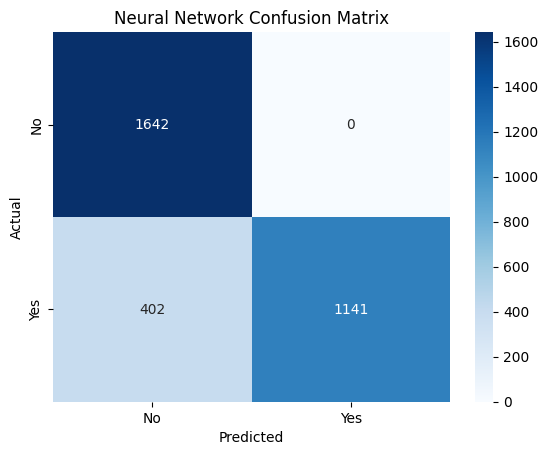

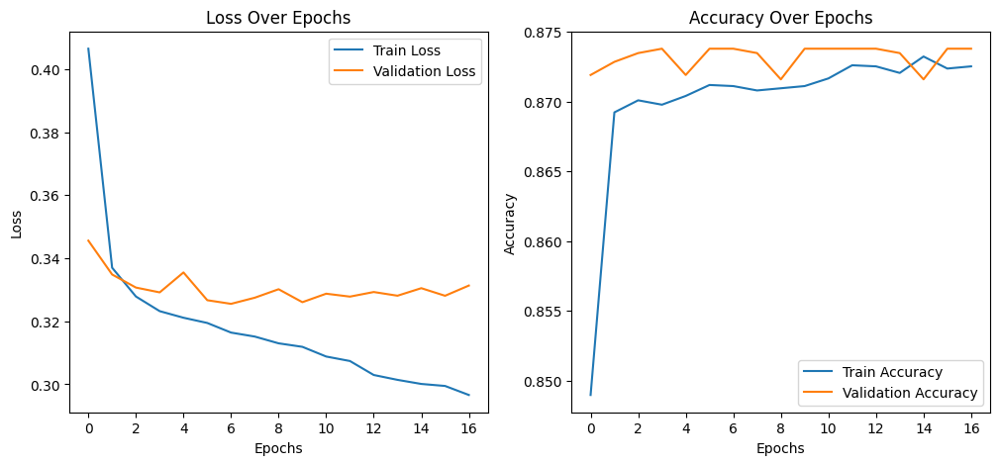


Neural Network Classification Report:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [18]:
# Print evaluation metrics
print(f"Neural Network Accuracy: {accuracy_nn:.4f}")
print(f"Precision: {precision_nn:.4f}")
print(f"Recall: {recall_nn:.4f}")
print(f"F1-Score: {f1_nn:.4f}")
print(f"AUC-ROC: {roc_auc_nn:.4f}")

# Confusion Matrix
conf_matrix_nn = confusion_matrix(y_test, y_pred_nn)
sns.heatmap(conf_matrix_nn, annot=True, fmt="d", cmap="Blues", xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Neural Network Confusion Matrix")
plt.show()

# Plot Training Progress (Loss and Accuracy)
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Classification Report
print("\nNeural Network Classification Report:\n", classification_report(y_test, y_pred_nn))

# Ensemble of FF and CNN (batch_size = 16)

In [19]:
# Define the model
input_layer = Input(shape=(x_train.shape[1],))

# Simplified feedforward branch
ff_branch = Dense(128, activation='relu')(input_layer)
ff_branch = Dropout(0.3)(ff_branch)

# Simplified CNN branch
cnn_branch = Reshape((x_train.shape[1], 1))(input_layer)
cnn_branch = Conv1D(64, kernel_size=3, activation='relu')(cnn_branch)
cnn_branch = MaxPooling1D(pool_size=2)(cnn_branch)
cnn_branch = Flatten()(cnn_branch)

# Merge branches
merged = concatenate([ff_branch, cnn_branch])
merged = Dense(64, activation='relu')(merged)
outputs = Dense(1, activation='sigmoid')(merged)

# Create model
nn_model = Model(inputs=input_layer, outputs=outputs)

# Compile model
nn_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Basic callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    verbose=1
)

# Train the model without class weights first
history = nn_model.fit(
    x_train, 
    y_train,
    validation_data=(x_test, y_test),
    epochs=200, 
    batch_size=16,
    callbacks=[early_stopping, lr_scheduler],
    verbose=1
)

Epoch 1/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - accuracy: 0.8362 - loss: 0.4017 - val_accuracy: 0.8703 - val_loss: 0.3481 - learning_rate: 0.0010
Epoch 2/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.8670 - loss: 0.3303 - val_accuracy: 0.8732 - val_loss: 0.3267 - learning_rate: 0.0010
Epoch 3/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.8711 - loss: 0.3199 - val_accuracy: 0.8722 - val_loss: 0.3232 - learning_rate: 0.0010
Epoch 4/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.8705 - loss: 0.3183 - val_accuracy: 0.8722 - val_loss: 0.3266 - learning_rate: 0.0010
Epoch 5/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.8690 - loss: 0.3172 - val_accuracy: 0.8719 - val_loss: 0.3259 - learning_rate: 0.0010
Epoch 6/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.8704 - loss: 0.3128 - val_accuracy: 0.8725 - val_loss: 0.3345 - learning_rate: 0.0010
Epoch 7/200
797/797 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.8717 - loss

In [ ]:
# Model Evaluation
accuracy_nn = accuracy_score(y_test, y_pred_nn)
precision_nn = precision_score(y_test, y_pred_nn)
recall_nn = recall_score(y_test, y_pred_nn)
f1_nn = f1_score(y_test, y_pred_nn)
roc_auc_nn = roc_auc_score(y_test, y_pred_nn)

Neural Network Accuracy: 0.8738
Precision: 1.0000
Recall: 0.7395
F1-Score: 0.8502
AUC-ROC: 0.8697


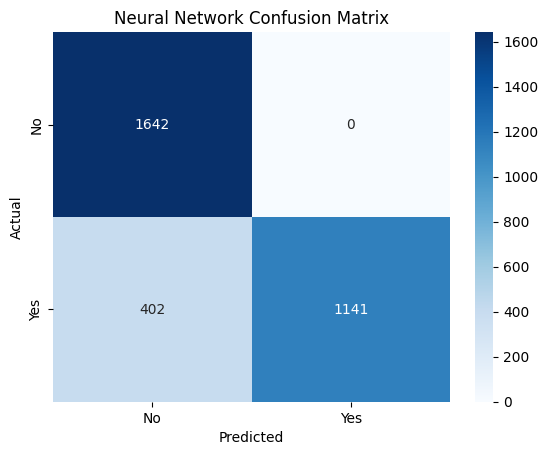

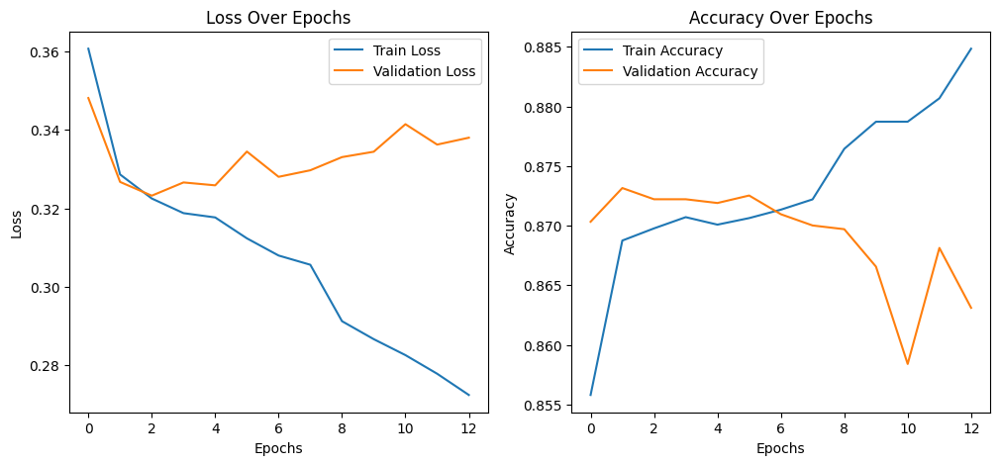


Neural Network Classification Report:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [21]:
# Print evaluation metrics
print(f"Neural Network Accuracy: {accuracy_nn:.4f}")
print(f"Precision: {precision_nn:.4f}")
print(f"Recall: {recall_nn:.4f}")
print(f"F1-Score: {f1_nn:.4f}")
print(f"AUC-ROC: {roc_auc_nn:.4f}")

# Confusion Matrix
conf_matrix_nn = confusion_matrix(y_test, y_pred_nn)
sns.heatmap(conf_matrix_nn, annot=True, fmt="d", cmap="Blues", xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Neural Network Confusion Matrix")
plt.show()

# Plot Training Progress (Loss and Accuracy)
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Classification Report
print("\nNeural Network Classification Report:\n", classification_report(y_test, y_pred_nn))

# Ensemble of FF and CNN (broader network, batch_size = 8)

In [22]:
# Define the model with enhanced architecture
input_layer = Input(shape=(x_train.shape[1],))

# Enhanced feedforward branch with residual connections
ff_branch = Dense(256, activation='relu')(input_layer)
ff_branch = BatchNormalization()(ff_branch)
ff_branch = Dropout(0.3)(ff_branch)
ff_residual = ff_branch

ff_branch = Dense(256, activation='relu')(ff_branch)
ff_branch = BatchNormalization()(ff_branch)
ff_branch = Dropout(0.3)(ff_branch)
ff_branch = Dense(256, activation='relu')(ff_branch)
ff_branch = concatenate([ff_branch, ff_residual])  # Residual connection

# Enhanced CNN branch with multiple filter sizes
cnn_branch1 = Reshape((x_train.shape[1], 1))(input_layer)
cnn_branch1 = Conv1D(128, kernel_size=3, activation='relu', padding='same')(cnn_branch1)
cnn_branch1 = BatchNormalization()(cnn_branch1)
cnn_branch1 = MaxPooling1D(pool_size=2)(cnn_branch1)

cnn_branch2 = Reshape((x_train.shape[1], 1))(input_layer)
cnn_branch2 = Conv1D(128, kernel_size=5, activation='relu', padding='same')(cnn_branch2)
cnn_branch2 = BatchNormalization()(cnn_branch2)
cnn_branch2 = MaxPooling1D(pool_size=2)(cnn_branch2)

cnn_branch1 = Flatten()(cnn_branch1)
cnn_branch2 = Flatten()(cnn_branch2)

# Merge all branches
merged = concatenate([ff_branch, cnn_branch1, cnn_branch2])

# Deep fusion layers
merged = Dense(512, activation='relu')(merged)
merged = BatchNormalization()(merged)
merged = Dropout(0.4)(merged)

merged = Dense(256, activation='relu')(merged)
merged = BatchNormalization()(merged)
merged = Dropout(0.3)(merged)

merged = Dense(128, activation='relu')(merged)
merged = BatchNormalization()(merged)
merged = Dropout(0.2)(merged)

outputs = Dense(1, activation='sigmoid')(merged)

# Create model
nn_model = Model(inputs=input_layer, outputs=outputs)

# Compile with fixed learning rate
nn_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy', 
             tf.keras.metrics.AUC(name='auc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

# Enhanced callbacks
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=15,
    restore_best_weights=True,
    mode='max'
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    mode='max',
    verbose=1
)

# Train with enhanced settings
history = nn_model.fit(
    x_train, 
    y_train,
    validation_data=(x_test, y_test),
    epochs=300,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate with threshold optimization
predictions = nn_model.predict(x_test)
thresholds = np.arange(0.3, 0.7, 0.05)
best_threshold = 0.5
best_accuracy = 0

for threshold in thresholds:
    y_pred = (predictions > threshold).astype(int)
    accuracy = accuracy_score(y_test, y_pred)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_threshold = threshold

# Final predictions with optimized threshold
final_predictions = (predictions > best_threshold).astype(int)

Epoch 1/300
399/399 ━━━━━━━━━━━━━━━━━━━━ 60s 105ms/step - accuracy: 0.8157 - auc: 0.8608 - loss: 0.4513 - precision: 0.8791 - recall: 0.7371 - val_accuracy: 0.4845 - val_auc: 0.8734 - val_loss: 1.2773 - val_precision: 0.4845 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/300
399/399 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.8572 - auc: 0.8797 - loss: 0.3545 - precision: 0.9553 - recall: 0.7486 - val_accuracy: 0.8725 - val_auc: 0.8814 - val_loss: 0.3240 - val_precision: 1.0000 - val_recall: 0.7369 - learning_rate: 0.0010
Epoch 3/300
399/399 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.8555 - auc: 0.8727 - loss: 0.3545 - precision: 0.9667 - recall: 0.7399 - val_accuracy: 0.8732 - val_auc: 0.8714 - val_loss: 0.3253 - val_precision: 1.0000 - val_recall: 0.7382 - learning_rate: 0.0010
Epoch 4/300
399/399 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - accuracy: 0.8647 - auc: 0.8854 - loss: 0.3331 - precision: 0.9769 - recall: 0.7541 - val_accuracy: 0.8735 - val_auc: 0.8731 - val_loss:

In [ ]:
# Model Evaluation
accuracy_nn = accuracy_score(y_test, final_predictions)
precision_nn = precision_score(y_test, final_predictions)
recall_nn = recall_score(y_test, final_predictions)
f1_nn = f1_score(y_test, final_predictions)
roc_auc_nn = roc_auc_score(y_test, final_predictions)

Neural Network Accuracy: 0.8744
Precision: 1.0000
Recall: 0.7408
F1-Score: 0.8511
AUC-ROC: 0.8704


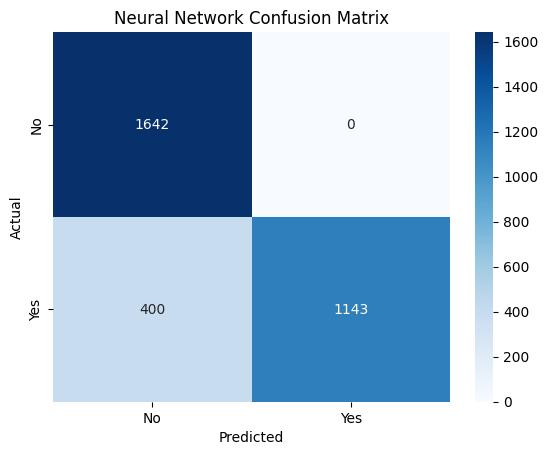

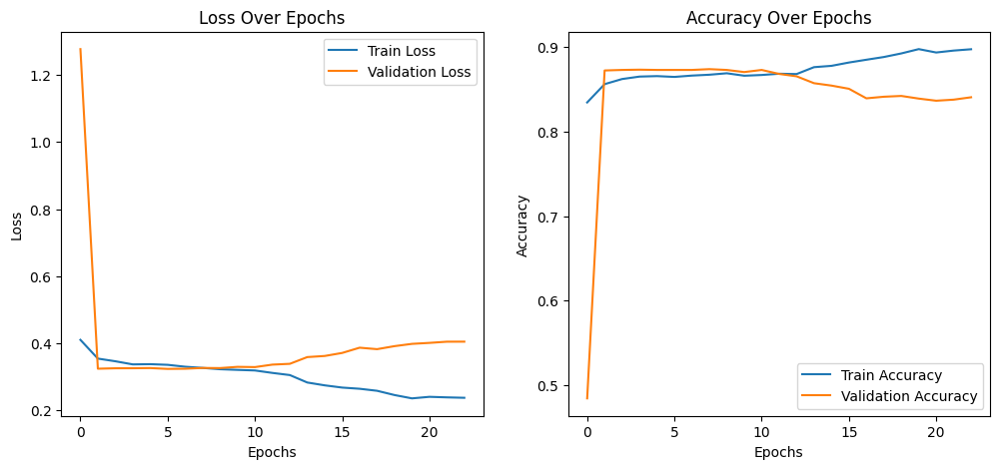


Neural Network Classification Report:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      1642
           1       1.00      0.74      0.85      1543

    accuracy                           0.87      3185
   macro avg       0.90      0.87      0.87      3185
weighted avg       0.90      0.87      0.87      3185



In [24]:
# Print evaluation metrics
print(f"Neural Network Accuracy: {accuracy_nn:.4f}")
print(f"Precision: {precision_nn:.4f}")
print(f"Recall: {recall_nn:.4f}")
print(f"F1-Score: {f1_nn:.4f}")
print(f"AUC-ROC: {roc_auc_nn:.4f}")

# Confusion Matrix
conf_matrix_nn = confusion_matrix(y_test, final_predictions)
sns.heatmap(conf_matrix_nn, annot=True, fmt="d", cmap="Blues", xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Neural Network Confusion Matrix")
plt.show()

# Plot Training Progress (Loss and Accuracy)
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Over Epochs")
plt.legend()

plt.show()

# Classification Report
print("\nNeural Network Classification Report:\n", classification_report(y_test, final_predictions))